### Additional SCA1- dataset analysis

In [1]:
# packages

import os
import glob
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from seaborn import despine
from seaborn import axes_style
from matplotlib.pyplot import suptitle
import matplotlib.colors
import scanpy.external as sce  # imputation
import scanorama # batch correction
from matplotlib.ticker import FormatStrFormatter

sc.settings.verbosity = 0  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)

/home/alm72/.conda/envs/sharon_org_env/lib/python3.8/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


scanpy==1.4.6 anndata==0.7.1 umap==0.4.4 numpy==1.18.5 scipy==1.4.1 pandas==1.0.4 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2


#### Load SNO and SPO data

In [2]:
'''SNO'''
SNO_sub_2_results_file = '/n/data2/bch/hemonc/ckim/SHARON/20200211_transplant_scRNASeq/scanpy_analysis/write/Sca1neg_SUB_2_SLonly_noSL13.h5ad'
SNO = sc.read(SNO_sub_2_results_file)

'SPO'

### Subcluster "ciliated cells" then check for gene expression. The below analysis resulted in the "ciliated cluster" being renamed to other.
- While Foxj1, Cd24a, and the ciliated signature are high in this cluster, the expression of other gene signatures lead us to rename the cluster "Other", as it appears in the manuscript

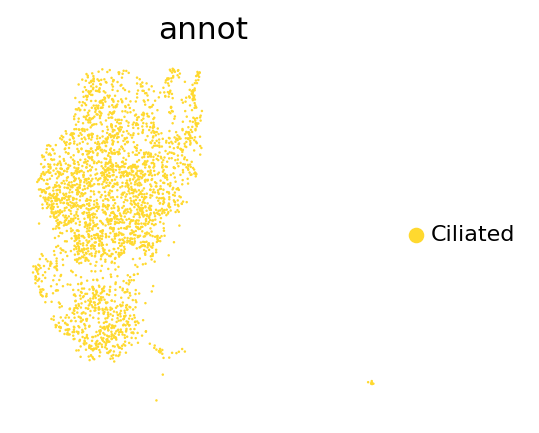

In [6]:
cil = SNO[SNO.obs['annot'].isin(['Ciliated'])] # subset cluster

# plot sub data
rcParams['figure.figsize'] = 3,3
rcParams['figure.facecolor'] = 'white'
sc.pl.umap(cil, color=['annot'], hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, frameon=False, show=False)

### Recompute the UMAP for the "ciliated cluster"

In [12]:
cil_reclust = cil.copy() # make copy

# recompute knn and UMAP
sc.pp.neighbors(cil_reclust, n_neighbors=5, n_pcs=20)
sc.tl.umap(cil_reclust)

### Plot canonical gene expression on the recomputed UMAP

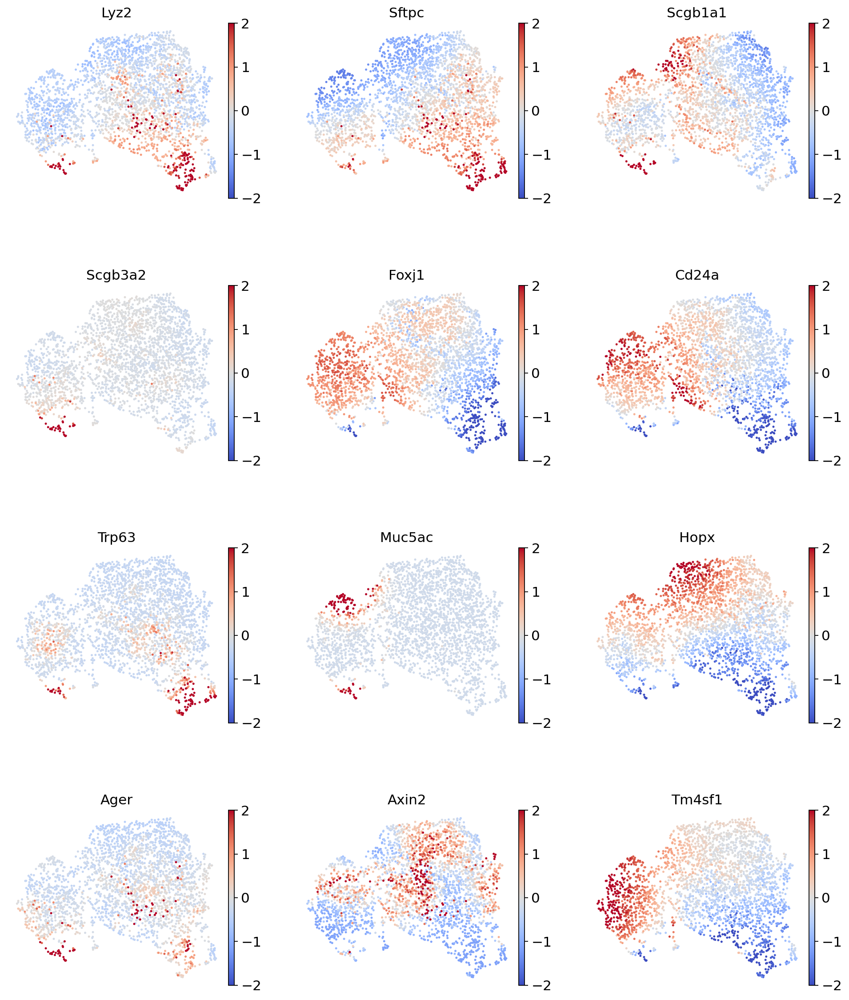

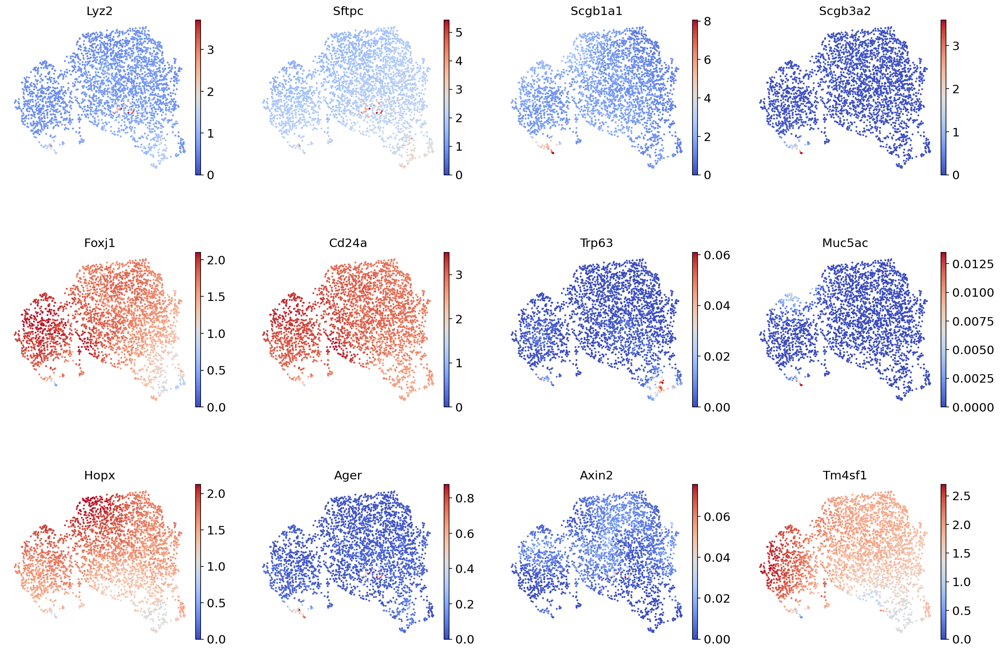

In [10]:
scaled = sc.pp.scale(cil_reclust, copy=True)

# scaled expression
sc.pl.umap(scaled, 
color=['Lyz2','Sftpc','Scgb1a1','Scgb3a2','Foxj1','Cd24a',
'Trp63','Muc5ac','Hopx','Ager','Axin2','Tm4sf1'], 
hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=20, frameon=False, show=False, use_raw=False, cmap='coolwarm', 
vmin=-2, vmax=2, ncols=3)

# unscaled expression
sc.pl.umap(cil_reclust, 
color=['Lyz2','Sftpc','Scgb1a1','Scgb3a2','Foxj1','Cd24a',
'Trp63','Muc5ac','Hopx','Ager','Axin2','Tm4sf1'], 
hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=20, frameon=False, show=False, use_raw=False, cmap='coolwarm', 
vmin=0, ncols=4)

### Remove AT1 cells from the organoid cluster then perform differential expression analysis

In [11]:
at2_sub = SNO[SNO.obs['annot'].isin(['AT2','AT2-Org Transp.'])]

Trying to set attribute `.uns` of view, copying.


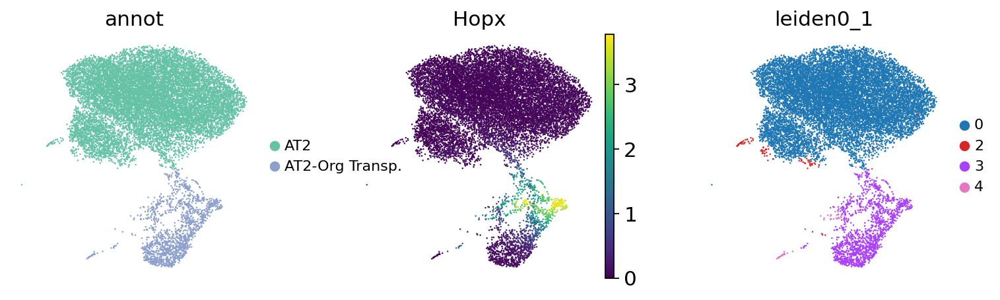

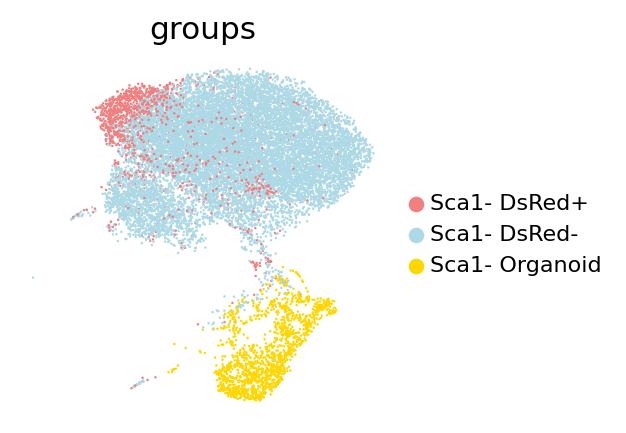

In [12]:
#Plot
rcParams['figure.figsize'] = 3,3
rcParams['figure.facecolor'] = 'white'
sc.pl.umap(at2_sub, color=['annot','Hopx','leiden0_1'], hspace=0.5, legend_fontsize=10, vmin=0,
legend_loc='right margin', size=5, frameon=False, use_raw=False, show=False)

sc.pl.umap(at2_sub, color=['groups'], palette=['lightcoral','lightblue','gold'], hspace=0.5, legend_fontsize=10, 
legend_loc='right margin', size=5, frameon=False, show=False)

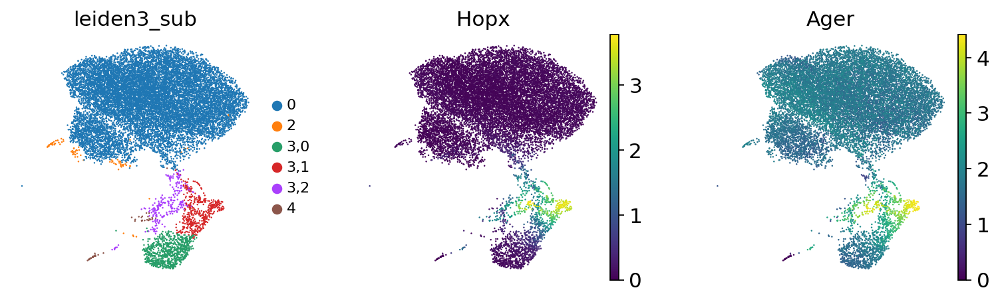

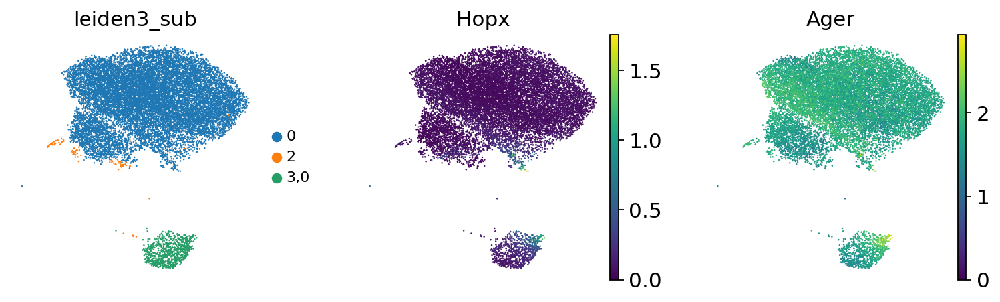

In [13]:
# Subcluster organoid cluster into AT2 and AT2 states
sc.tl.leiden(at2_sub, resolution=0.1, restrict_to = ('leiden0_1', ['3']) ,key_added='leiden3_sub')
#plot
sc.pl.umap(at2_sub, color=['leiden3_sub','Hopx','Ager'], hspace=0.5, legend_fontsize=10, vmin=0,
legend_loc='right margin', size=5, frameon=False, use_raw=False, show=False)

# Remove AT1 clusters
at2_sub = at2_sub[~at2_sub.obs['leiden3_sub'].isin(['3,1','3,2','4'])]
#plot
sc.pl.umap(at2_sub, color=['leiden3_sub','Hopx','Ager'], hspace=0.5, legend_fontsize=10, vmin=0,
legend_loc='right margin', size=5, frameon=False, use_raw=False, show=False)

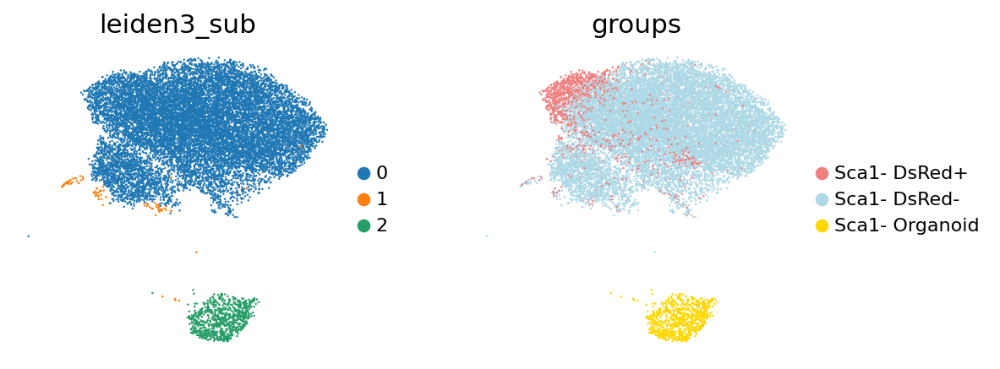

In [21]:
new_cluster_names = [
    '0', #0
    '1', #2
    '2', #3,0
]
at2_sub.rename_categories('leiden3_sub', new_cluster_names)

#plot
sc.pl.umap(at2_sub, color=['leiden3_sub','groups'], hspace=0.5, legend_fontsize=10, vmin=0,
legend_loc='right margin', size=5, frameon=False, use_raw=False, show=False)

#### DE analysis using subset data

In [16]:
'''DE analysis'''

ngenes = 3000
method = 'wilcoxon'
groupby = 'groups'

sc.tl.rank_genes_groups(at2_sub, groupby=groupby, key_added=f'rank_genes_{groupby}', method=method, n_genes=ngenes)

# save data to adata_subset.uns
result = at2_sub.uns[f'rank_genes_{groupby}']
groups = result['names'].dtype.names

de_data = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})
de_data.to_excel(f"/n/data2/bch/hemonc/ckim/SHARON/20210805_Sca1neg_AT2OrgNativeTransplanted_AT1orgsREMOVED.xlsx", sheet_name='Sheet1')

Trying to set attribute `.uns` of view, copying.


#### Plot data after filtering for statistical significant and ordering by log fold change

In [15]:
## Plot DE data

# Load DE gene data
groupby = 'groups'

result = at2_sub.uns[f'rank_genes_{groupby}']
groups = result['names'].dtype.names

de_data = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})

# added list manually, because I restricted the clusters used for DE analysis
clusters = sorted(list(set(at2_sub.obs['groups'])))

top_select_DE_genes = dict()
top_DE_genes = dict()

for i in clusters:
    df1 = de_data.loc[(de_data[f'{i}_p'] < 0.05)] # filter insignificant genes
    df1 = df1[[f'{i}_n',f'{i}_p',f'{i}_l']] # only keep columns of interest
    df1 = df1.sort_values(by=f'{i}_l', ascending=False) # sort based on log fold change
    top_genes = df1[f'{i}_n'].tolist() # create list for each cluster
    top_DE_genes.update({i:top_genes}) # dict for all sig genes
    print(f'Total marker_genes in {i} with pval<0.05', len(top_genes))
    top = top_genes[:25] 
    top_select_DE_genes.update({i:top}) # dict for top selected genes per cluster

Total marker_genes in Sca1- DsRed+ with pval<0.05 3000
Total marker_genes in Sca1- DsRed- with pval<0.05 400
Total marker_genes in Sca1- Organoid with pval<0.05 3000


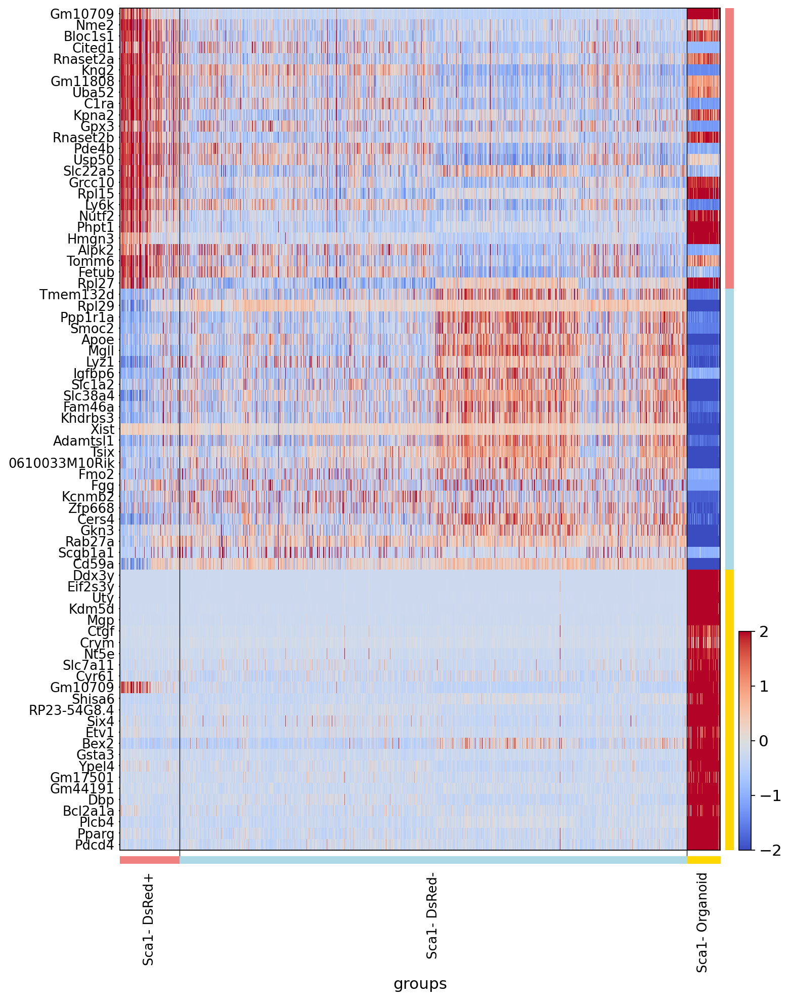

GridSpec(3, 3, height_ratios=[0, 13.87, 0.13], width_ratios=[10, 0.14, 0.2])

In [17]:
at2_scaled = sc.pp.scale(at2_sub, copy=True)

cmap='coolwarm'

sc.pl.heatmap(at2_scaled, top_select_DE_genes, groupby='groups', swap_axes=True, vmin=-2, vmax=2, 
cmap=cmap, use_raw=False, figsize=(10,14), show_gene_labels=True)

#### GO analysis using the filtered dataset

In [24]:
''' Load DE results from the AT2 comparison '''

groupby = 'groups'

result = at2_sub.uns[f'rank_genes_{groupby}']
groups = result['names'].dtype.names

de_data = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})

# added list manually, because I restricted the clusters used for DE analysis
clusters = sorted(list(set(at2_sub.obs['groups'])))

top_select_DE_genes = dict()
top_DE_genes = dict()

for i in clusters:
    df1 = de_data.loc[(de_data[f'{i}_p'] < 0.05)] # filter insignificant genes
    df1 = df1[[f'{i}_n',f'{i}_p',f'{i}_l']] # only keep columns of interest
    df1 = df1.sort_values(by=f'{i}_l', ascending=False) # sort based on log fold change
    top_genes = df1[f'{i}_n'].tolist() # create list for each cluster
    top_DE_genes.update({i:top_genes}) # dict for all sig genes
    print(f'Total marker_genes in {i} with pval<0.05', len(top_genes))
    top = top_genes[:25] 
    #l.append(top)
    top_select_DE_genes.update({i:top}) # dict for top selected genes per cluster

Total marker_genes in Sca1- DsRed+ with pval<0.05 3000
Total marker_genes in Sca1- DsRed- with pval<0.05 400
Total marker_genes in Sca1- Organoid with pval<0.05 3000


In [ ]:
# Look for enriched Gene Ontology Biological Process 2018 pathways

import gseapy as gp
from gseapy.plot import barplot, dotplot 

names = gp.get_library_name() 

# GO Analysis
dsRed_GOBio = gp.enrichr(gene_list = top_DE_genes['Sca1- DsRed+'],
description='dsRed_GOBio',
gene_sets=['GO_Biological_Process_2021'],
outdir='Enricher_analysis/SCA1 NEG sub_AT1 orgs removed/dsRed_SNO_GOBio',
cutoff=0.01
)

native_GOBio = gp.enrichr(gene_list = top_DE_genes['Sca1- DsRed-'],
description='native_GOBio',
gene_sets=['GO_Biological_Process_2021'],
outdir='Enricher_analysis/SCA1 NEG sub_AT1 orgs removed/native_SNO_GOBio',
cutoff=0.01
)

org_GOBio = gp.enrichr(gene_list = top_DE_genes['Sca1- Organoid'],
description='native_GOBio',
gene_sets=['GO_Biological_Process_2021'],
outdir='Enricher_analysis/SCA1 NEG sub_AT1 orgs removed/org_SNO_GOBio',
cutoff=0.01
)

# filter for statistically significant terms
dsRed_sig = dsRed_GOBio.res2d.loc[(dsRed_GOBio.res2d['Adjusted P-value'] < 0.01)] 
native_sig = native_GOBio.res2d.loc[(native_GOBio.res2d['Adjusted P-value'] < 0.01)] 
org_sig = org_GOBio.res2d.loc[(org_GOBio.res2d['Adjusted P-value'] < 0.01)] 

dsRed_list = dsRed_sig['Term'].tolist() 
native_list = native_sig['Term'].tolist()
org_list = org_sig['Term'].tolist() 

print('# All dsRed terms:',len(dsRed_list))
print('# All native terms:',len(native_list))
print('# All org terms:',len(org_list))

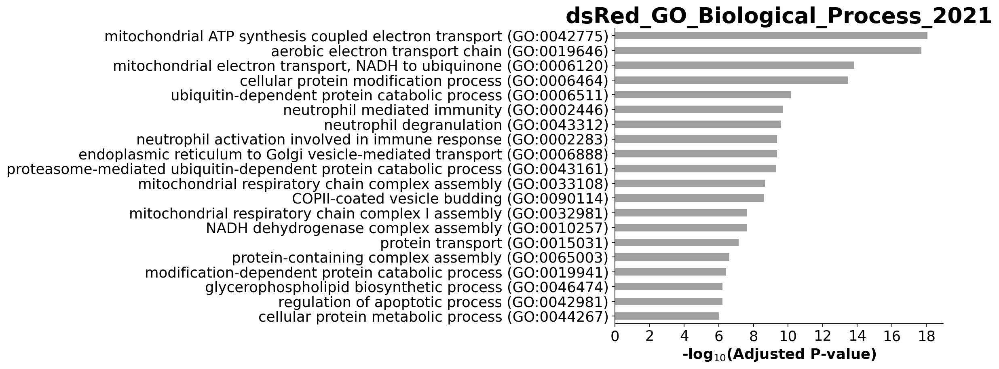

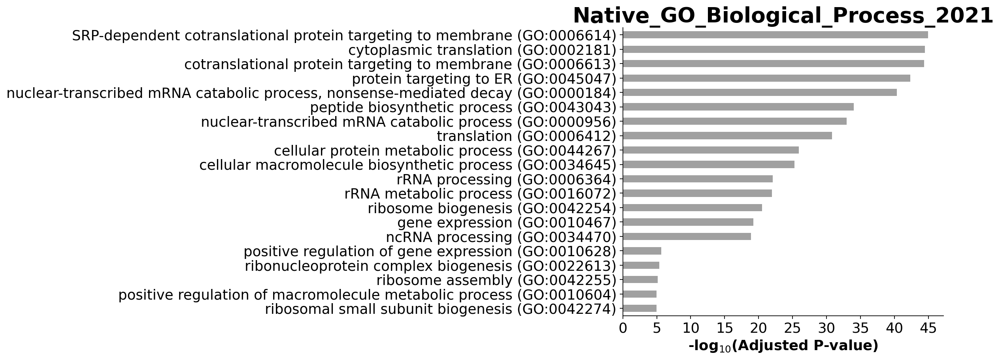

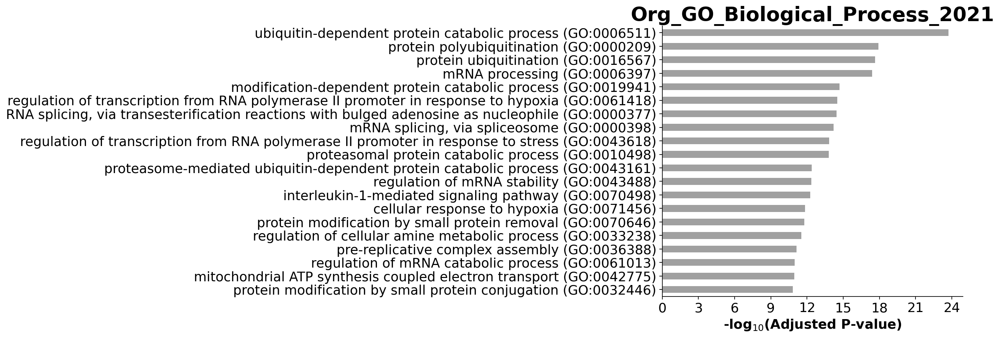

In [31]:
# simple plotting function
from gseapy.plot import barplot, dotplot

# to save your figure, make sure that ``ofname`` is not None
with axes_style({'axes.grid': False}):
    barplot(dsRed_GOBio.res2d, title='dsRed_GO_Biological_Process_2021', top_term=20, color='gray')
    barplot(native_GOBio.res2d, title='Native_GO_Biological_Process_2021', top_term=20, color='gray')
    barplot(org_GOBio.res2d, title='Org_GO_Biological_Process_2021', top_term=20, color='gray')

### DE analysis using dsRed+ and dsRed- AT2 cells only

In [42]:
'''DE analysis'''

ngenes = 3000
method = 'wilcoxon'
groupby = 'groups'

sc.tl.rank_genes_groups(sub, groupby=groupby, key_added=f'rank_genes_{groupby}', method=method, n_genes=ngenes)

# save data to adata_subset.uns
result = sub.uns[f'rank_genes_{groupby}']
groups = result['names'].dtype.names

de_data = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})
de_data.to_excel(f"/n/data2/bch/hemonc/ckim/SHARON/20210820_Sca1neg_AT2NativeTransplantedOnly.xlsx", sheet_name='Sheet1')


In [43]:
## Plot DE data

# Load DE gene data
groupby = 'groups'

result = sub.uns[f'rank_genes_{groupby}']
groups = result['names'].dtype.names

de_data = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})

# added list manually, because I restricted the clusters used for DE analysis
clusters = sorted(list(set(sub.obs['groups'])))

top_select_DE_genes = dict()
top_DE_genes = dict()

for i in clusters:
    df1 = de_data.loc[(de_data[f'{i}_p'] < 0.05)] # filter insignificant genes
    #df1 = de_data.loc[(de_data[f'{i}_l'] > 2)] # only genes with a log fold change > 2
    df1 = df1[[f'{i}_n',f'{i}_p',f'{i}_l']] # only keep columns of interest
    df1 = df1.sort_values(by=f'{i}_l', ascending=False) # sort based on log fold change
    top_genes = df1[f'{i}_n'].tolist() # create list for each cluster
    top_DE_genes.update({i:top_genes}) # dict for all sig genes
    print(f'Total marker_genes in {i} with pval<0.05', len(top_genes))
    top = top_genes[:25] 
    #l.append(top)
    top_select_DE_genes.update({i:top}) # dict for top selected genes per cluster

Total marker_genes in Sca1- DsRed+ with pval<0.05 3000
Total marker_genes in Sca1- DsRed- with pval<0.05 249


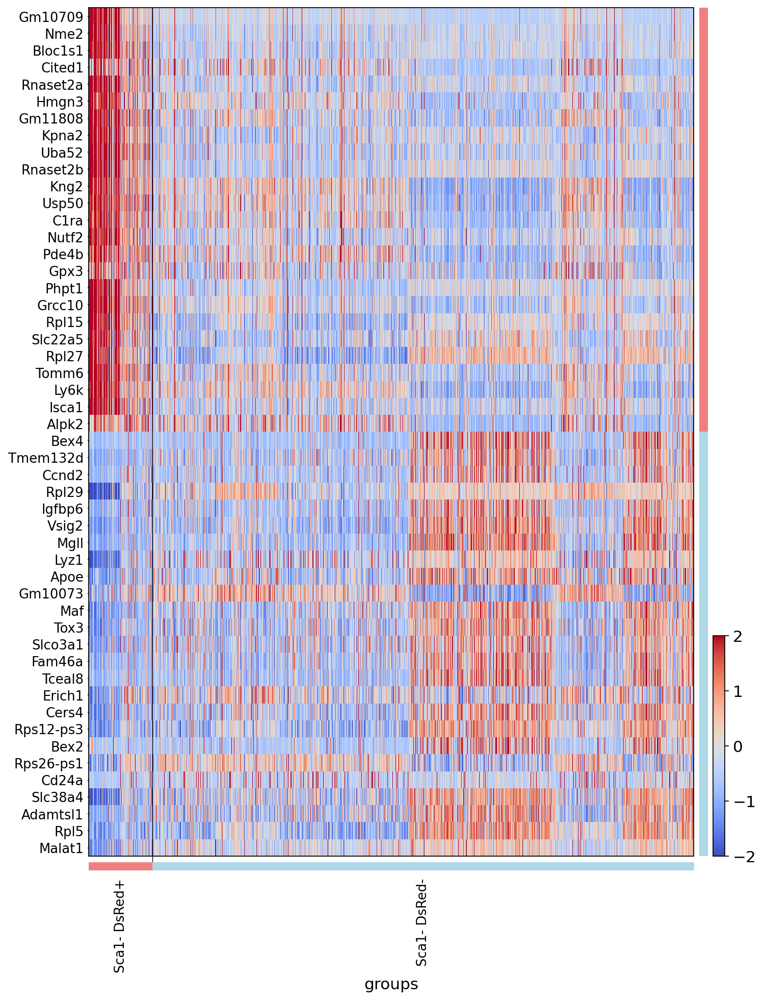

GridSpec(3, 3, height_ratios=[0, 13.87, 0.13], width_ratios=[10, 0.14, 0.2])

In [44]:
sub_scaled = sc.pp.scale(sub, copy=True) #relative expression

sc.pl.heatmap(sub_scaled, top_select_DE_genes, groupby='groups', swap_axes=True, vmin=-2, vmax=2, 
cmap='coolwarm', use_raw=False, figsize=(10,14), show_gene_labels=True)

In [ ]:
# Look for enriched Gene Ontology Biological Process 2018 pathways

import gseapy as gp
from gseapy.plot import barplot, dotplot 

names = gp.get_library_name() 

# GO Analysis
dsRed_GOBio = gp.enrichr(gene_list = top_DE_genes['Sca1- DsRed+'],
description='dsRed_GOBio',
gene_sets=['GO_Biological_Process_2021'],
outdir='Enricher_analysis/AT2TransOnly_dsRed_SNO_GOBio',
cutoff=0.01
)

native_GOBio = gp.enrichr(gene_list = top_DE_genes['Sca1- DsRed-'],
description='native_GOBio',
gene_sets=['GO_Biological_Process_2021'],
outdir='Enricher_analysis/AT2TransOnly_native_SNO_GOBio',
cutoff=0.01
)

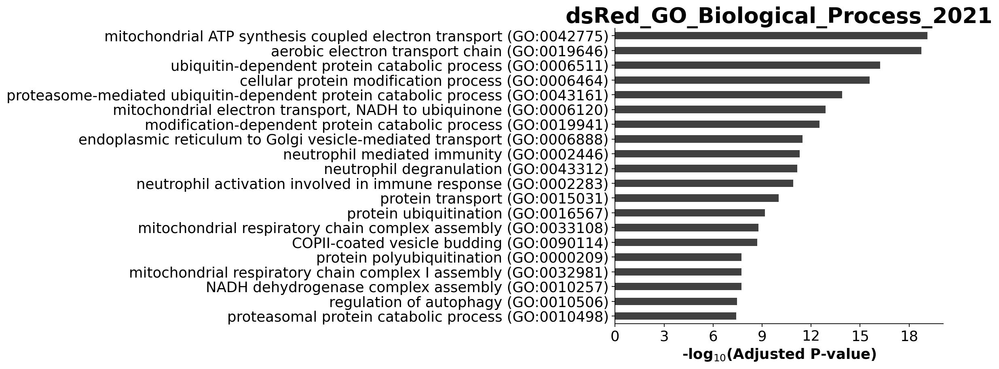

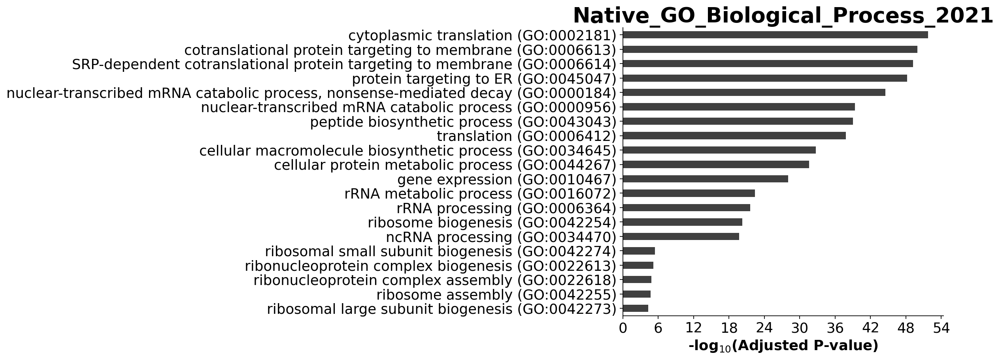

In [50]:
# simple plotting function
from gseapy.plot import barplot, dotplot

# to save your figure, make sure that ``ofname`` is not None
with axes_style({'axes.grid': False}):
    barplot(dsRed_GOBio.res2d, title='dsRed_GO_Biological_Process_2021', top_term=20, color='black')
    barplot(native_GOBio.res2d, title='Native_GO_Biological_Process_2021', top_term=20, color='black')

#### GO analysis comparing the SNO AT2 and Organoid cluster

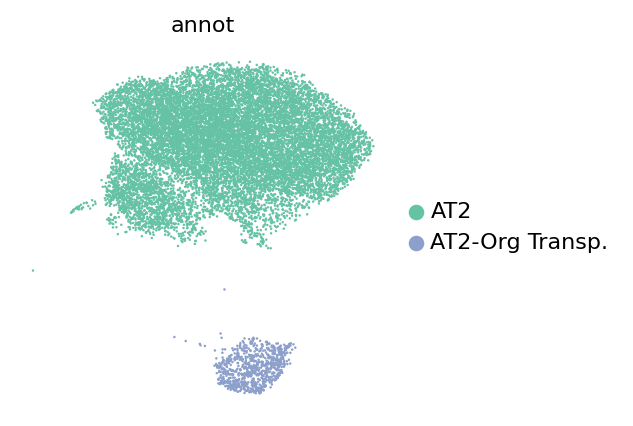

In [7]:
# original SNO data
rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
plt.rcParams['axes.titlesize'] = 10
sc.pl.umap(at2_sub, color=['annot'], hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, frameon=False, show=False)


In [20]:
# DE analysis of AT2 and AT2 organoid clusters

ngenes = 3000
method = 'wilcoxon'
groupby = 'annot'

sc.tl.rank_genes_groups(at2_sub, groupby=groupby, key_added=f'rank_genes_{groupby}', method=method, n_genes=ngenes)

# save data to adata_subset.uns
result = at2_sub.uns[f'rank_genes_{groupby}']
groups = result['names'].dtype.names

de_data = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'pvals_adj','logfoldchanges']})
de_data.to_excel(f"/n/data2/bch/hemonc/ckim/SHARON/20211213_Sca1neg_AT2OrgClustersOnly.xlsx", sheet_name='Sheet1')

In [9]:
## Plot DE data

# Load DE gene data
groupby = 'annot'

result = at2_sub.uns[f'rank_genes_{groupby}']
annot = result['names'].dtype.names

de_data = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in annot for key in ['names', 'pvals_adj','logfoldchanges']})

# added list manually, because I restricted the clusters used for DE analysis
clusters = sorted(list(set(at2_sub.obs['annot'])))

top_select_DE_genes = dict()
top_DE_genes = dict()

for i in clusters:
    df1 = de_data.loc[(de_data[f'{i}_p'] < 0.05)] # filter insignificant genes
    df1 = df1[[f'{i}_n',f'{i}_p',f'{i}_l']] # only keep columns of interest
    df1 = df1.sort_values(by=f'{i}_l', ascending=False) # sort based on log fold change
    top_genes = df1[f'{i}_n'].tolist() # create list for each cluster
    top_DE_genes.update({i:top_genes}) # dict for all sig genes
    print(f'Total marker_genes in {i} with pval<0.05', len(top_genes))
    top = top_genes[:25] 
    #l.append(top)
    top_select_DE_genes.update({i:top}) # dict for top selected genes per cluster

Total marker_genes in AT2 with pval<0.05 1008
Total marker_genes in AT2-Org Transp. with pval<0.05 3000


#### Top 5 DE genes per cluster (Sorted by log fold change)

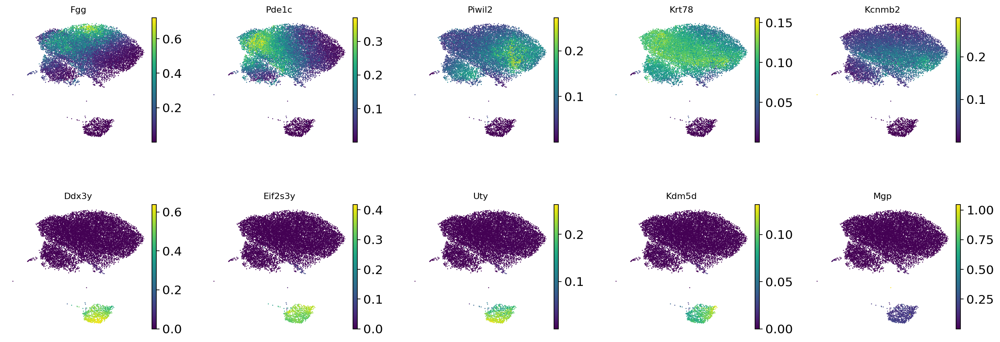

In [16]:
rcParams["figure.facecolor"]='white'
rcParams['figure.figsize'] = 3,3
plt.rcParams['axes.titlesize'] = 10
sc.pl.umap(at2_sub, color=[
'Fgg',
'Pde1c',
'Piwil2',
'Krt78',
'Kcnmb2',
'Ddx3y',
'Eif2s3y',
'Uty',
'Kdm5d',
'Mgp'], hspace=0.5, legend_fontsize=10, legend_loc='right margin', size=5, frameon=False, show=False,
use_raw=False, ncols=5)

In [18]:
# Look for enriched Gene Ontology Biological Process 2018 pathways

import gseapy as gp
from gseapy.plot import barplot, dotplot 

names = gp.get_library_name() 

# AT2 cluster (Cluster 0)
AT2_C0_GOBio = gp.enrichr(gene_list = top_DE_genes['AT2'],
description='AT2_cluster0_GOBio',
gene_sets=['GO_Biological_Process_2021'],
outdir='Enricher_analysis/SCA1 NEG Cluster 0 AT2 vs Cluster 3 organoids_AT1 orgs removed/AT2_CO_GOBio',
cutoff=0.01
)

# Primary SNOs (Cluster 3)
org_C3_GOBio = gp.enrichr(gene_list = top_DE_genes['AT2-Org Transp.'],
description='Organoids_cluster3_GOBio',
gene_sets=['GO_Biological_Process_2021'],
outdir='Enricher_analysis/SCA1 NEG Cluster 0 AT2 vs Cluster 3 organoids_AT1 orgs removed/org_C3_GOBio',
cutoff=0.01
)


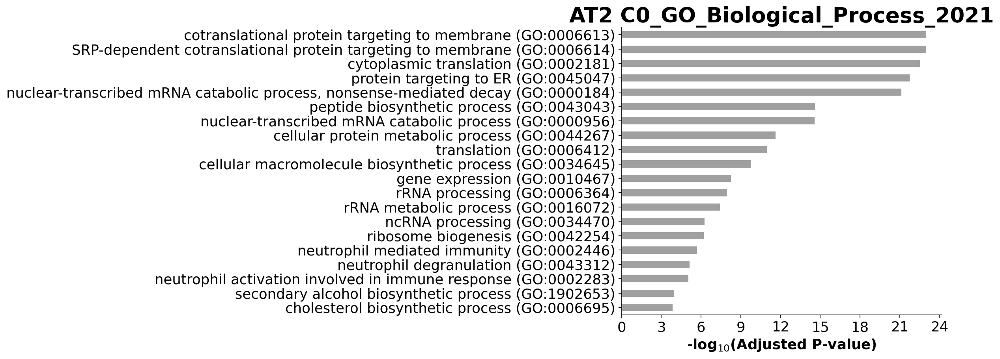

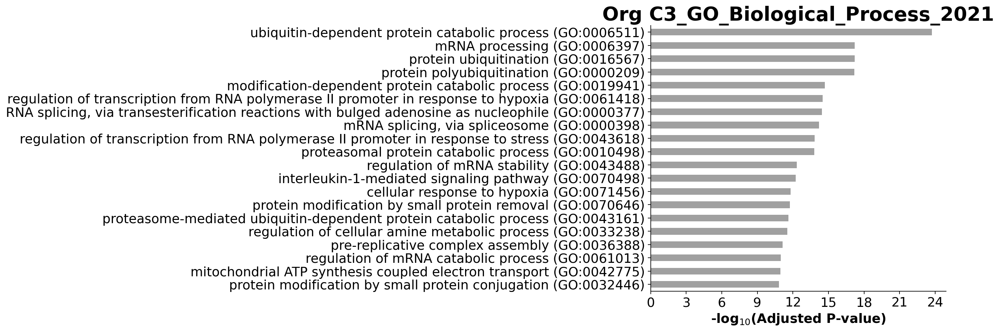

In [19]:
# simple plotting function
from gseapy.plot import barplot, dotplot

# to save your figure, make sure that ``ofname`` is not None
with axes_style({'axes.grid': False}):
    barplot(AT2_C0_GOBio.res2d, title='AT2 C0_GO_Biological_Process_2021', top_term=20, color='gray')
    barplot(org_C3_GOBio.res2d, title='Org C3_GO_Biological_Process_2021', top_term=20, color='gray')